In [1]:
import pandas as pd
import numpy as np
import igraph as ig
import collections
import matplotlib
%matplotlib inline

## Explore Data

In [2]:
df_unweighted = pd.read_csv('combined_final_unweighted.csv')
df_unweighted

,node_start,node_end,status
0,Hong Kong,Samoa,jurisdiction
1,Hong Kong,Samoa,jurisdiction
2,Hong Kong,Samoa,jurisdiction
3,Hong Kong,Samoa,jurisdiction
4,Hong Kong,Samoa,jurisdiction
...,...,...,...
338127,Indonesia,British Virgin Islands,officer_base
338128,Cook Islands,British Virgin Islands,officer_base
338129,Hong Kong,British Virgin Islands,officer_base
338130,Cook Islands,United Kingdom,officer_base


In [3]:
df_weighted = pd.read_csv('combined_final_weighted.csv')
df_weighted

,node_start,node_end,status,weight
0,Hong Kong,Samoa,jurisdiction,2.0
1,Hong Kong,Samoa,jurisdiction,2.0
2,Hong Kong,Samoa,jurisdiction,2.0
3,Hong Kong,Samoa,jurisdiction,2.0
4,Hong Kong,Samoa,jurisdiction,2.0
...,...,...,...,...
338119,Indonesia,British Virgin Islands,officer_base,1.0
338120,Cook Islands,British Virgin Islands,officer_base,1.0
338121,Hong Kong,British Virgin Islands,officer_base,1.0
338122,Cook Islands,United Kingdom,officer_base,1.0


In [4]:
df_weighted['status'].unique()

array(['jurisdiction', 'intermediary_base', 'intermediary_jurisdiction',
       'officer_base', 'officer_jurisdiction'], dtype=object)

In [5]:
df_weighted_grouped = pd.read_csv('combined_final_weighted_groupedby.csv')
df_weighted_grouped

,node_start,node_end,weight
0,Albania,Bahamas,4.0
1,Algeria,British Virgin Islands,2.0
2,Algeria,United Kingdom,2.0
3,Algeria,United States,1.0
4,Andorra,Bahamas,52.0
...,...,...,...
2835,Zimbabwe,Hong Kong,3.0
2836,Zimbabwe,Jersey,1.0
2837,Zimbabwe,Panama,6.0
2838,Zimbabwe,Russia,2.0


In [6]:
df_weighted_grouped.describe()

,weight
count,2840.000000
mean,194.889613
std,1729.454201
min,0.500000
25%,2.000000
50%,5.000000
75%,24.000000
max,65366.500000


In [7]:
df_weighted_grouped['norm_weights']=(df_weighted_grouped['weight']-df_weighted_grouped['weight'].min())/(df_weighted_grouped['weight'].max()-df_weighted_grouped['weight'].min())

df_weighted_grouped


,node_start,node_end,weight,norm_weights
0,Albania,Bahamas,4.0,0.000054
1,Algeria,British Virgin Islands,2.0,0.000023
2,Algeria,United Kingdom,2.0,0.000023
3,Algeria,United States,1.0,0.000008
4,Andorra,Bahamas,52.0,0.000788
...,...,...,...,...
2835,Zimbabwe,Hong Kong,3.0,0.000038
2836,Zimbabwe,Jersey,1.0,0.000008
2837,Zimbabwe,Panama,6.0,0.000084
2838,Zimbabwe,Russia,2.0,0.000023


In [8]:
df_weighted_grouped.describe()

,weight,norm_weights
count,2840.000000,2840.000000
mean,194.889613,0.002974
std,1729.454201,0.026458
min,0.500000,0.000000
25%,2.000000,0.000023
50%,5.000000,0.000069
75%,24.000000,0.000360
max,65366.500000,1.000000


In [9]:
df_weighted_grouped['log_weights'] = np.log(df_weighted_grouped['weight']) + 1
df_weighted_grouped

,node_start,node_end,weight,norm_weights,log_weights
0,Albania,Bahamas,4.0,0.000054,2.386294
1,Algeria,British Virgin Islands,2.0,0.000023,1.693147
2,Algeria,United Kingdom,2.0,0.000023,1.693147
3,Algeria,United States,1.0,0.000008,1.000000
4,Andorra,Bahamas,52.0,0.000788,4.951244
...,...,...,...,...,...
2835,Zimbabwe,Hong Kong,3.0,0.000038,2.098612
2836,Zimbabwe,Jersey,1.0,0.000008,1.000000
2837,Zimbabwe,Panama,6.0,0.000084,2.791759
2838,Zimbabwe,Russia,2.0,0.000023,1.693147


In [10]:
df_weighted_grouped.describe()

,weight,norm_weights,log_weights
count,2840.000000,2840.000000,2840.000000
mean,194.889613,0.002974,3.102217
std,1729.454201,0.026458,2.019293
min,0.500000,0.000000,0.306853
25%,2.000000,0.000023,1.693147
50%,5.000000,0.000069,2.609438
75%,24.000000,0.000360,4.178054
max,65366.500000,1.000000,12.087765


### Convert Data to an Undirected Edge List

In [11]:
# df_jur_grouped_list = df_jur_grouped.values.tolist()
# df_jur_grouped_list

In [12]:
# d = collections.defaultdict(int)
# for n1, n2, v in df_jur_grouped_list:
#     d[min(n1, n2), max(n1, n2)] += v
# result = [[k[0], k[1], v] for k, v in d.items()]

In [13]:
# df_net = pd.DataFrame(result)
# df_net

In [14]:
# df_net = df_net.rename(columns = {0:'node_1', 1:'node_2', 2: 'weight'})
# df_net

In [15]:
#df_net.to_csv('undirected_weighted_grouped.csv', index = False)

In [16]:
# df_net.describe()

# All Relationships

## Create Graph

In [17]:
g = ig.Graph.TupleList(df_weighted_grouped.itertuples(index=False), directed=True, edge_attrs={'weight': "log_weights"})


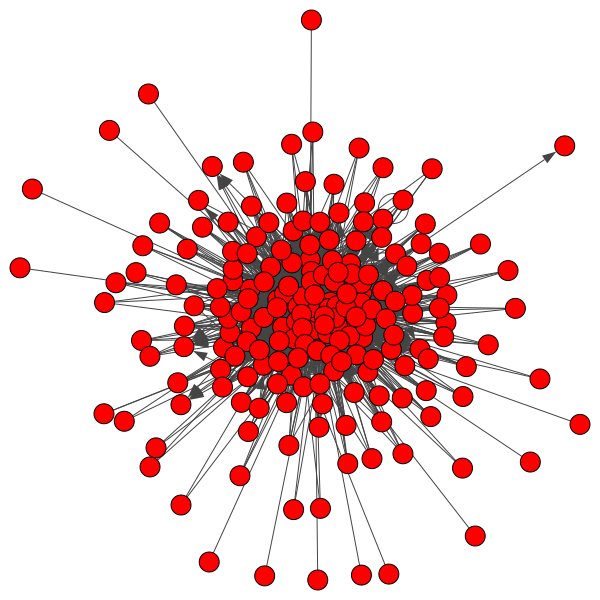

In [18]:
ig.plot(g)

In [19]:
g.diameter()

4

In [20]:
print( "Clustering Coefficient: ", g.transitivity_undirected())

Clustering Coefficient:  0.3859593515919117


In [21]:
np.mean(g.degree())

28.979591836734695

In [22]:
np.mean(g.strength(weights = 'weight'))

5647.821428571428

In [92]:
df_strength = pd.DataFrame({'name': list(g.vs['name']), 'weighted_degree':g.strength(weights = 'weight') } )
df_strength = df_strength.sort_values('weighted_degree', ascending = False).reset_index(drop = True)
df_strength

,name,weighted_degree
0,British Virgin Islands,287863.5
1,Hong Kong,113074.5
2,Panama,109901.0
3,Switzerland,77214.5
4,Bahamas,40701.5
...,...,...
191,Bhutan,2.0
192,Yemen,2.0
193,Palestine,2.0
194,Northern Mariana Islands,1.5


In [24]:
df_indegree = pd.DataFrame({'name': list(g.vs['name']), 'weighted_indegree':g.strength(weights = 'weight', mode = 'in') } )
df_indegree = df_indegree.sort_values('weighted_indegree', ascending = False).reset_index(drop = True)
df_indegree

,name,weighted_indegree
0,British Virgin Islands,280925.0
1,Panama,89885.0
2,Seychelles,31501.5
3,Bahamas,31085.0
4,Niue,18912.0
...,...,...
191,Finland,0.0
192,Fiji,0.0
193,El Salvador,0.0
194,Egypt,0.0


In [25]:
df_outdegree = pd.DataFrame({'name': list(g.vs['name']), 'weighted_outdegree':g.strength(weights = 'weight', mode = 'out') } )
df_outdegree = df_outdegree.sort_values('weighted_outdegree', ascending = False).reset_index(drop = True)
df_outdegree

,name,weighted_outdegree
0,Hong Kong,98929.5
1,Switzerland,76988.5
2,Taiwan,34922.5
3,Jersey,29443.5
4,China,22683.0
...,...,...
191,Netherlands Antilles,0.0
192,Dubai,0.0
193,Labuan,0.0
194,Nevada,0.0


## Metrics

In [26]:
def get_diameter(community):
    
    diameters = []
    
    for i in range(len(community.subgraphs())):
    
        diameters.append(community.subgraphs()[i].diameter())

    return (diameters)

In [27]:
def get_transitivity(community):
    
    transitivity = []
    
    for i in range(len(community.subgraphs())):
    
        transitivity.append(community.subgraphs()[i].transitivity_undirected())

    return (transitivity)

In [28]:
def get_avg_degree(community):
    
    degree = []
    
    for i in range(len(community.subgraphs())):
    
        degree.append(np.mean(community.subgraphs()[i].degree()))

    return degree

In [29]:
def get_avg_weighted_degree(community):
    
    weighted_degree = []
    
    for i in range(len(community.subgraphs())):
    
        weighted_degree.append(np.mean(community.subgraphs()[i].strength(weights = 'weight')))

    return weighted_degree

## Community Detection

In [30]:
# Define colors used for visualization
colors = ['blue', 'yellow', 'green','purple', 'pink', 'orange', 'lightcoral', 'plum', 'darkgreen', 'darkblue', 'rosybrown',
         'crimson', 'steelblue', 'khaki', 'moccasin', 'orangered', 'fuchsia', 'thistle', 'salmon', 'chocolate', 'lightseagreen',
         'springgreen', 'darkseagreen', 'deeppink', 'mediumvioletred','olive']

### Label Propogation Community Detection

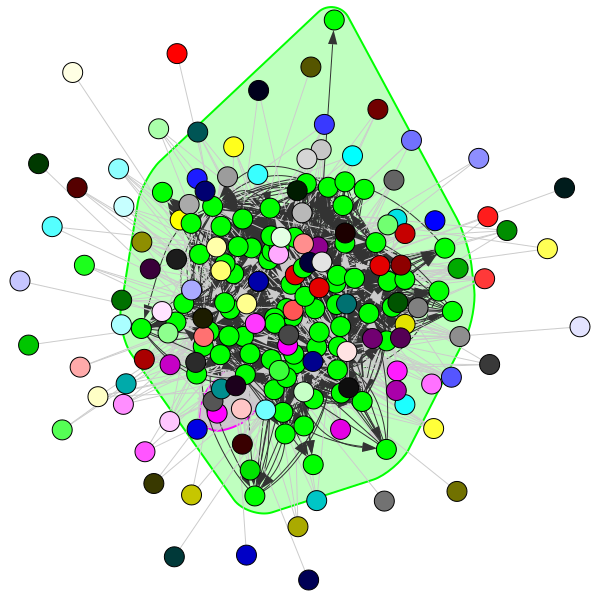

In [31]:
comm_lp= g.community_label_propagation(weights = 'weight')

ig.plot(comm_lp, mark_groups = True, layout="drl")

In [32]:
modularity = g.modularity(comm_lp, weights='weight')
print(modularity)

0.0012260925737978567


In [33]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_lp))
print('average degree: ', get_avg_degree(comm_lp))
print('transitivity: ', get_transitivity(comm_lp))
print('diameter: ', get_diameter(comm_lp))

average weighted degree:  [0.0, 13304.311688311689, 0.0, 0.0, 84.0, 0.0, 0.0, 165.33333333333334, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
average degree:  [0.0, 46.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.3333333333333333, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

### Leading Eigenvector Community Detection

/Users/susankoruthu/opt/anaconda3/lib/python3.8/site-packages/igraph/__init__.py:1281: RuntimeWarning: This method was developed for undirected graphs at src/community/leading_eigenvector.c:530
  membership, _, q = GraphBase.community_leading_eigenvector(


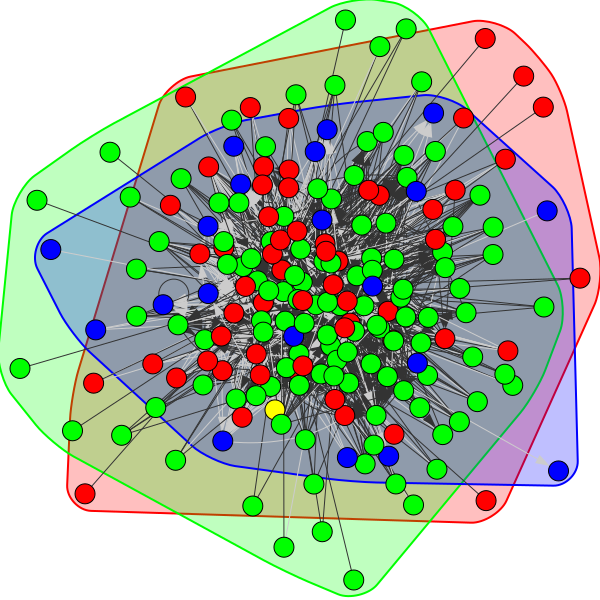

In [34]:
comm_leading_eigenvector= g.community_leading_eigenvector(weights = 'weight')

ig.plot(comm_leading_eigenvector, mark_groups = True, layout="drl")

In [35]:
modularity = g.modularity(comm_leading_eigenvector, weights='weight')
print(modularity)

0.1503749727369289


In [36]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_leading_eigenvector))
print('average degree: ', get_avg_degree(comm_leading_eigenvector))
print('transitivity: ', get_transitivity(comm_leading_eigenvector))
print('diameter: ', get_diameter(comm_leading_eigenvector))

average weighted degree:  [3447.0862068965516, 4977.735042735043, 0.85, 0.0]
average degree:  [8.172413793103448, 24.666666666666668, 0.2, 0.0]
transitivity:  [0.2783573806881243, 0.45566413318856314, nan, nan]
diameter:  [3, 3, 1, 0]


In [37]:
df_leading_eigenvector = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_leading_eigenvector.membership } )
df_leading_eigenvector

,name,community
0,Albania,0
1,Bahamas,0
2,Algeria,1
3,British Virgin Islands,1
4,United Kingdom,1
...,...,...
191,Venezuela,0
192,Vietnam,1
193,Yemen,0
194,Zambia,1


In [38]:
df_leading_eigenvector.describe()

,community
count,196.000000
mean,0.816327
std,0.621775
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,3.000000


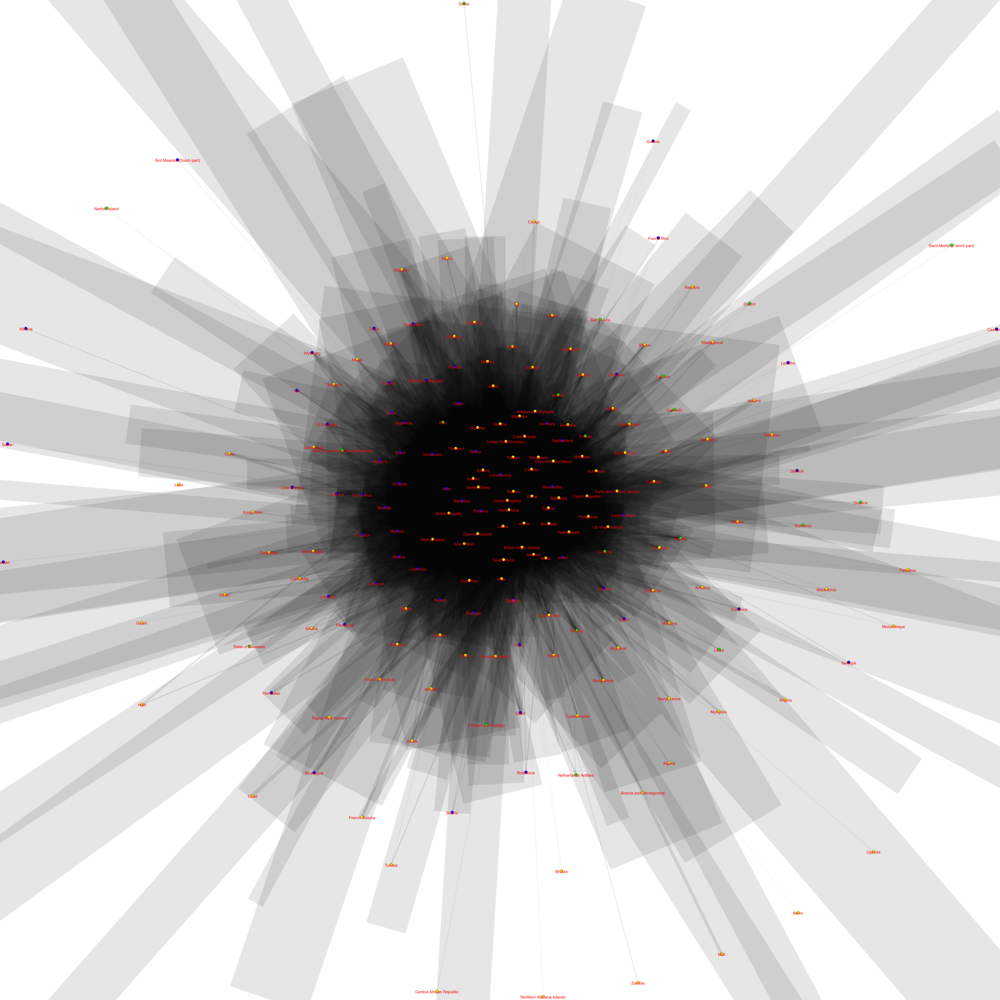

In [39]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_leading_eigenvector.membership)):
    vertex_colors.append(colors[comm_leading_eigenvector.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = g.es['weight']

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'log_images/directed_images/communities_leading_eigenvector.png', vertex_label = g.vs['name'] , **visual_style)

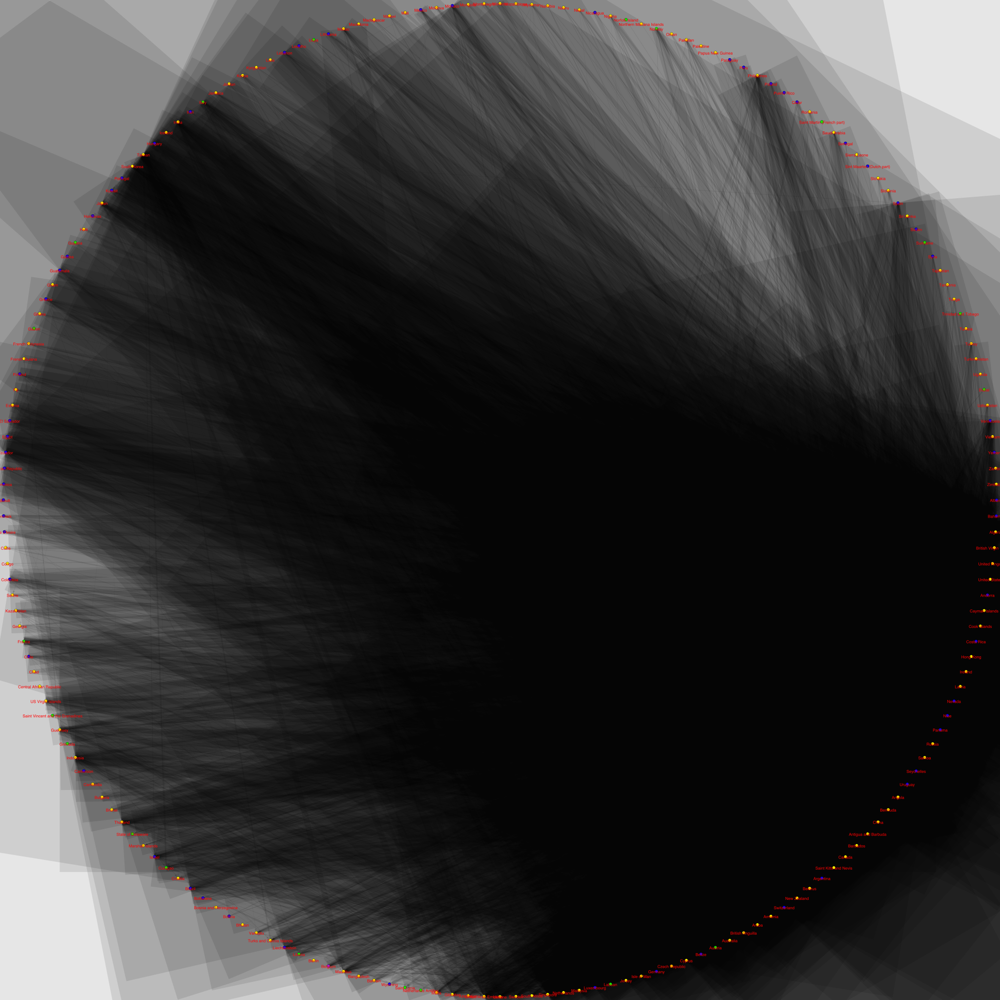

In [40]:
# Set the layout
my_layout = g.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'log_images/directed_images/leading_vector_circular.png', vertex_label = g.vs['name'] , **visual_style)

In [41]:
for i in range(len(comm_leading_eigenvector.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = comm_leading_eigenvector.subgraphs()[i].es['weight']
    # Set the layout
    my_layout = comm_leading_eigenvector.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_leading_eigenvector.subgraphs()[i],'log_images/directed_images/leading_eigenvector_subgraph' + str(i) + '.png' ,vertex_label = comm_leading_eigenvector.subgraphs()[i].vs['name'],**visual_style  )
    

### Spinglass Community Detection

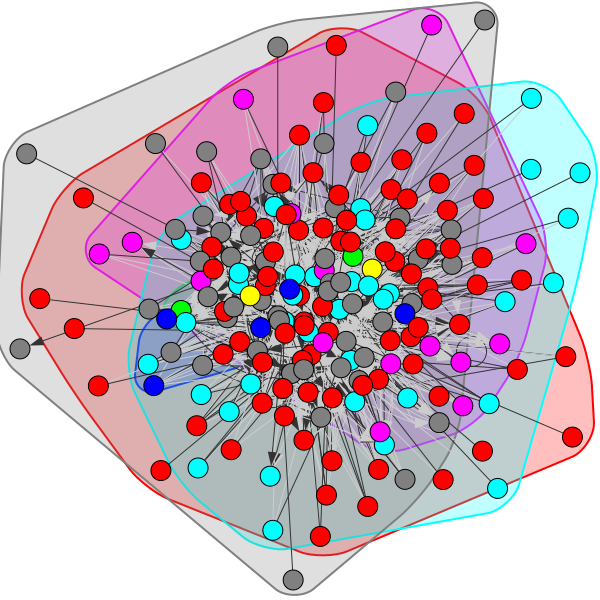

In [42]:
comm_spinglass = g.community_spinglass(weights = 'weight')

ig.plot(comm_spinglass, mark_groups = True, layout="drl")

In [43]:
modularity = g.modularity(comm_spinglass, weights='weight')
print(modularity)

0.09436179576191037


In [44]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_spinglass))
print('average degree: ', get_avg_degree(comm_spinglass))
print('transitivity: ', get_transitivity(comm_spinglass))
print('diameter: ', get_diameter(comm_spinglass))

average weighted degree:  [1821.9883720930231, 845.0, 313.6, 230.0, 118.26666666666667, 2155.3783783783783, 3872.734693877551]
average degree:  [6.395348837209302, 1.0, 2.0, 1.0, 2.4, 11.35135135135135, 9.306122448979592]
transitivity:  [0.15010252904989746, nan, 0.0, nan, 0.1111111111111111, 0.5674846625766872, 0.37317468902109246]
diameter:  [5, 1, 1, 1, 3, 3, 4]


In [45]:
df_spinglass = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_spinglass.membership } )
df_spinglass

,name,community
0,Albania,6
1,Bahamas,6
2,Algeria,0
3,British Virgin Islands,0
4,United Kingdom,0
...,...,...
191,Venezuela,6
192,Vietnam,0
193,Yemen,6
194,Zambia,0


In [46]:
df_spinglass.describe()

,community
count,196.000000
mean,2.841837
std,2.666119
min,0.000000
25%,0.000000
50%,4.000000
75%,5.250000
max,6.000000


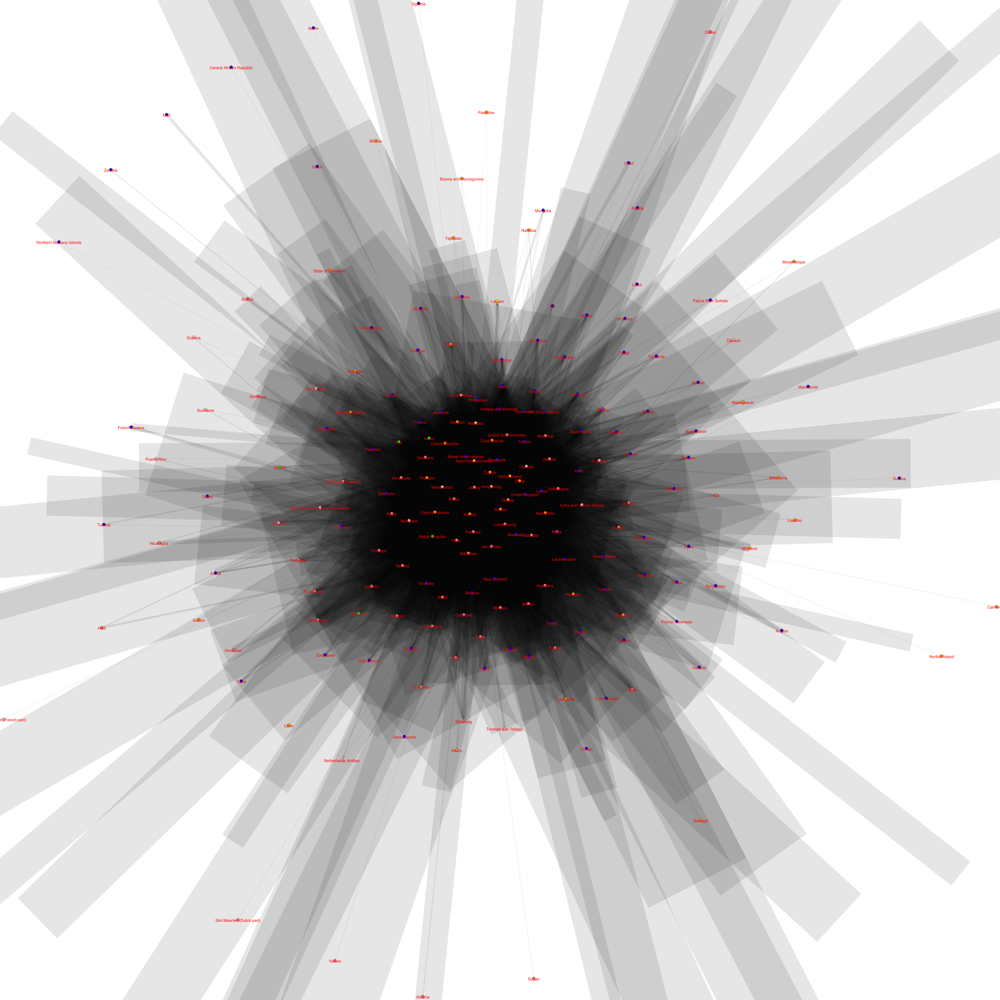

In [47]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_spinglass.membership)):
    vertex_colors.append(colors[comm_spinglass.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = g.es['weight']

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'log_images/directed_images/communities_spinglass.png', vertex_label = g.vs['name'] , **visual_style)

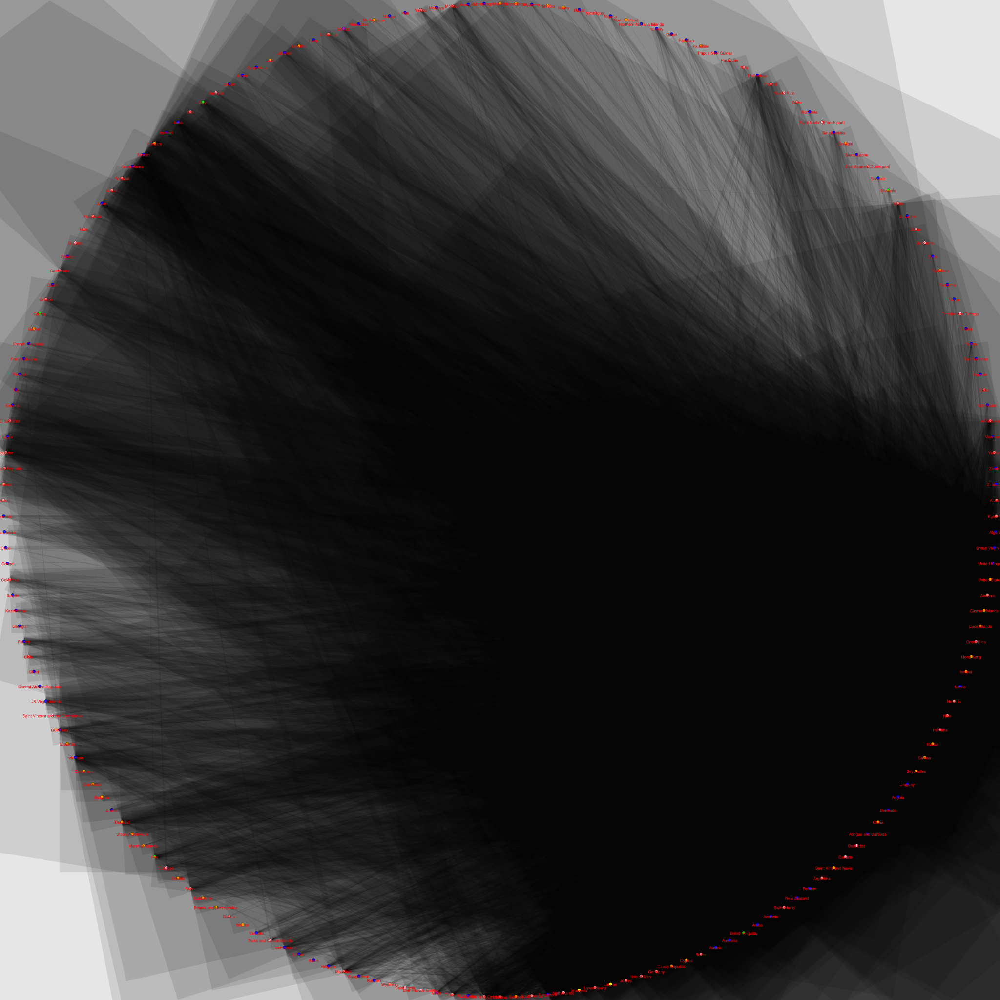

In [48]:
# Set the layout
my_layout = g.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'log_images/directed_images/spinglass_circular.png', vertex_label = g.vs['name'] , **visual_style)

In [49]:
for i in range(len(comm_spinglass.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = comm_spinglass.subgraphs()[i].es['weight']
    # Set the layout
    my_layout = comm_spinglass.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_spinglass.subgraphs()[i],'log_images/directed_images/spinglass_subgraph' + str(i) + '.png' ,vertex_label = comm_spinglass.subgraphs()[i].vs['name'],**visual_style  )
    

### Walktrap Community Detection

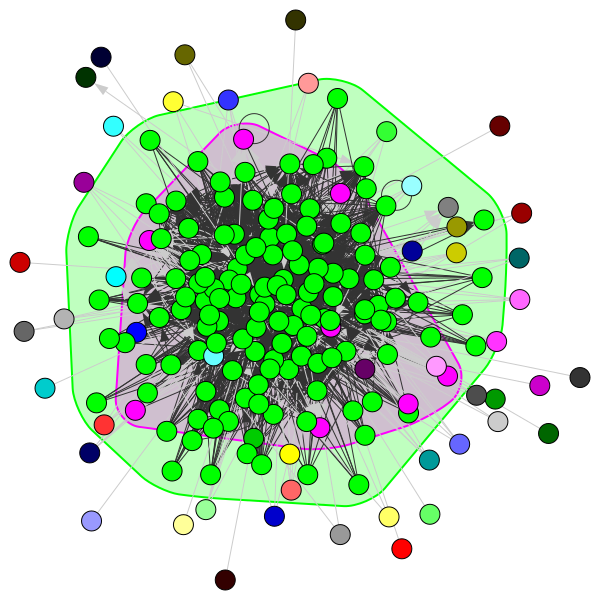

In [50]:
walktrap = g.community_walktrap(weights = 'weight', steps = 2)

comm_walktrap = walktrap.as_clustering()

ig.plot(comm_walktrap, mark_groups = True, layout="drl")

In [51]:
modularity = g.modularity(comm_walktrap, weights='weight')
print(modularity)

0.002050025384918412


In [52]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_walktrap))
print('average degree: ', get_avg_degree(comm_walktrap))
print('transitivity: ', get_transitivity(comm_walktrap))
print('diameter: ', get_diameter(comm_walktrap))

average weighted degree:  [0.0, 7984.430656934306, 0.0, 0.0, 143.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
average degree:  [0.0, 36.90510948905109, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
transitivity:  [nan, 0.44463040899562895, nan, nan, 0.0, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]
diameter:  [0, 4, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [53]:
df_walktrap = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_walktrap.membership } )
df_walktrap

,name,community
0,Albania,0
1,Bahamas,1
2,Algeria,2
3,British Virgin Islands,1
4,United Kingdom,1
...,...,...
191,Venezuela,1
192,Vietnam,1
193,Yemen,51
194,Zambia,52


In [54]:
df_walktrap.describe()

,community
count,196.000000
mean,7.867347
std,13.652566
min,0.000000
25%,1.000000
50%,1.000000
75%,4.000000
max,52.000000


In [55]:
# ##plot community
# visual_style = {}

# vertex_colors = []

# for i in range(len(comm_walktrap.membership)):
#     vertex_colors.append(colors[comm_walktrap.membership[i]])
    
# # Set bbox and margin
# visual_style["bbox"] = (5000,5000)
# visual_style["margin"] = 17

# # Set vertex colours
# visual_style["vertex_color"] = vertex_colors

# # Set edge width
# visual_style["edge_width"] = g.es['weight']

# # Set edge color
# visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# # Set vertex size
# visual_style["vertex_size"] = 15

# # Set vertex label size
# visual_style["vertex_label_size"] = 20

# # Set vertex label color
# visual_style["vertex_label_color"] = 'red'

# # Don't curve the edges
# visual_style["edge_curved"] = False

# # Set the layout
# my_layout = g.layout_fruchterman_reingold()
# visual_style["layout"] = my_layout

# # Plot the graph
# ig.plot(g,'log_images/directed_images/communities_walktrap.png', vertex_label = g.vs['name'] , **visual_style)

In [56]:
# # Set the layout
# my_layout = g.layout_circle()
# visual_style["layout"] = my_layout

# # Plot the graph
# ig.plot(g,'log_images/directed_images/walktrap_circular.png', vertex_label = g.vs['name'] , **visual_style)

In [57]:
# for i in range(len(comm_walktrap.subgraphs())):
    
#     visual_style["bbox"] = (2000,2000)
#     visual_style["margin"] = 17
    
#     # Set vertex colours
#     visual_style["vertex_color"] = 'green'

#     # Set edge width
#     visual_style["edge_width"] = comm_walktrap.subgraphs()[i].es['weight']
#     # Set the layout
#     my_layout = comm_walktrap.subgraphs()[i].layout_fruchterman_reingold()
#     visual_style["layout"] = my_layout

#     ig.plot(comm_walktrap.subgraphs()[i],'log_images/directed_images/walktrap_subgraph' + str(i) + '.png' ,vertex_label = comm_walktrap.subgraphs()[i].vs['name'],**visual_style  )
    

### Infomap Community Detection

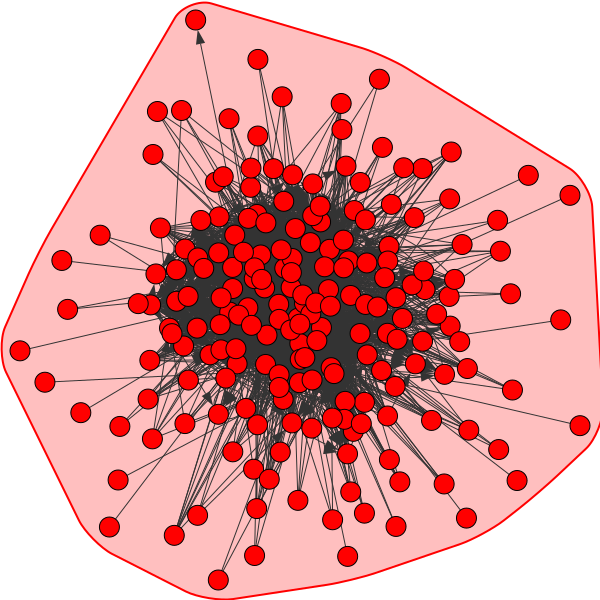

In [58]:
comm_infomap = g.community_infomap(edge_weights = 'weight')

ig.plot(comm_infomap, mark_groups = True, layout="drl")

In [59]:
modularity = g.modularity(comm_infomap, weights='weight')
print(modularity)

0.0


In [60]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_infomap))
print('average degree: ', get_avg_degree(comm_infomap))
print('transitivity: ', get_transitivity(comm_infomap))
print('diameter: ', get_diameter(comm_infomap))

average weighted degree:  [5647.821428571428]
average degree:  [28.979591836734695]
transitivity:  [0.3859593515919117]
diameter:  [4]


In [61]:
df_infomap = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_infomap.membership } )
df_infomap

,name,community
0,Albania,0
1,Bahamas,0
2,Algeria,0
3,British Virgin Islands,0
4,United Kingdom,0
...,...,...
191,Venezuela,0
192,Vietnam,0
193,Yemen,0
194,Zambia,0


# All Jurisdictions

In [62]:
df_weighted['status'].unique()

array(['jurisdiction', 'intermediary_base', 'intermediary_jurisdiction',
       'officer_base', 'officer_jurisdiction'], dtype=object)

In [63]:
jurisdiction_list = ['jurisdiction', 'officer_jurisdiction','intermediary jurisdiction']

In [64]:
df_weighted_jur = df_weighted[df_weighted['status'].isin(jurisdiction_list)]
df_jur = df_weighted_jur.drop(['status'], axis = 1)
df_jur

,node_start,node_end,weight
0,Hong Kong,Samoa,2.0
1,Hong Kong,Samoa,2.0
2,Hong Kong,Samoa,2.0
3,Hong Kong,Samoa,2.0
4,Hong Kong,Samoa,2.0
...,...,...,...
221136,Indonesia,Samoa,0.5
221137,Cayman Islands,Samoa,0.5
221138,British Virgin Islands,Samoa,0.5
221139,China,Samoa,0.5


In [65]:
df_jur_grouped = df_jur.groupby(['node_start','node_end'], as_index = False).sum()
df_jur_grouped

,node_start,node_end,weight
0,Albania,Bahamas,4.0
1,Andorra,Bahamas,52.0
2,Andorra,British Virgin Islands,78.0
3,Andorra,Cayman Islands,2.0
4,Andorra,Costa Rica,6.0
...,...,...,...
1222,Vietnam,Panama,2.0
1223,Yemen,Panama,2.0
1224,Zambia,British Virgin Islands,4.0
1225,Zimbabwe,British Virgin Islands,10.0


In [66]:
df_jur_grouped['log_weights'] = np.log(df_jur_grouped['weight']) + 1
df_jur_grouped

,node_start,node_end,weight,log_weights
0,Albania,Bahamas,4.0,2.386294
1,Andorra,Bahamas,52.0,4.951244
2,Andorra,British Virgin Islands,78.0,5.356709
3,Andorra,Cayman Islands,2.0,1.693147
4,Andorra,Costa Rica,6.0,2.791759
...,...,...,...,...
1222,Vietnam,Panama,2.0,1.693147
1223,Yemen,Panama,2.0,1.693147
1224,Zambia,British Virgin Islands,4.0,2.386294
1225,Zimbabwe,British Virgin Islands,10.0,3.302585


### Convert Data to an Undirected Edge List

In [67]:
# df_jur_grouped_list = df_jur_grouped.values.tolist()
# df_jur_grouped_list

In [68]:
# d = collections.defaultdict(int)
# for n1, n2, v in df_jur_grouped_list:
#     d[min(n1, n2), max(n1, n2)] += v
# result = [[k[0], k[1], v] for k, v in d.items()]

In [69]:
# df_net = pd.DataFrame(result)
# df_net

In [70]:
# df_net = df_net.rename(columns = {0:'node_1', 1:'node_2', 2: 'weight'})
# df_net

In [71]:
#df_net.to_csv('undirected_weighted_grouped.csv', index = False)

In [72]:
# df_net.describe()

## Create Graph

In [73]:
g_aj = ig.Graph.TupleList(df_jur_grouped.itertuples(index=False), directed=True, edge_attrs={'weight': "log_weights"})


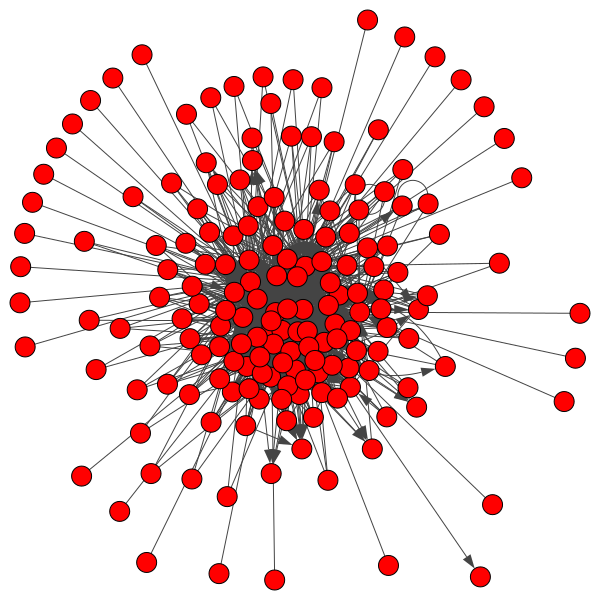

In [74]:
ig.plot(g_aj)

In [75]:
g_aj.diameter()

5

In [76]:
print( "Clustering Coefficient: ", g_aj.transitivity_undirected())

Clustering Coefficient:  0.24745484400656814


In [77]:
np.mean(g_aj.degree())

14.10344827586207

In [78]:
np.mean(g_aj.strength(weights = 'weight'))

4979.028735632184

In [79]:
df_strength = pd.DataFrame({'name': list(g_aj.vs['name']), 'weighted_degree':g_aj.strength(weights = 'weight') } )
df_strength = df_strength.sort_values('weighted_degree', ascending = False).reset_index(drop = True)
df_strength

,name,weighted_degree
0,British Virgin Islands,232588.5
1,Panama,104014.0
2,Hong Kong,78953.0
3,Switzerland,76304.0
4,Bahamas,40402.0
...,...,...
169,Malawi,2.0
170,Georgia,2.0
171,Yemen,2.0
172,Nauru,2.0


## Community Detection

### Label Propogation Community Detection

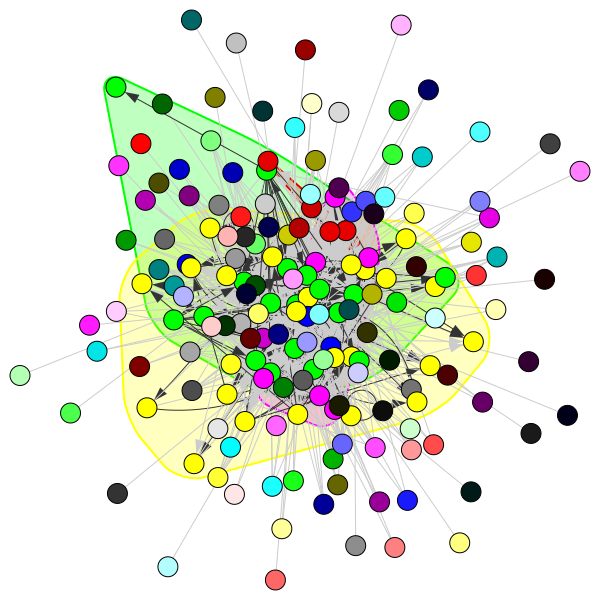

In [80]:
comm_lp_aj= g_aj.community_label_propagation(weights = 'weight')

ig.plot(comm_lp_aj, mark_groups = True, layout="drl")

In [81]:
modularity = g_aj.modularity(comm_lp_aj, weights='weight')
print(modularity)

0.01852161374058491


In [82]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_lp_aj))
print('average degree: ', get_avg_degree(comm_lp_aj))
print('transitivity: ', get_transitivity(comm_lp_aj))
print('diameter: ', get_diameter(comm_lp_aj))

average weighted degree:  [0.0, 23851.277777777777, 30.0, 449.5217391304348, 194.0, 0.0, 0.0, 165.33333333333334, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
average degree:  [0.0, 13.88888888888889, 1.0, 6.260869565217392, 5.0, 0.0, 0.0, 1.3333333333333333, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

### Leading Eigenvector Community Detection

/Users/susankoruthu/opt/anaconda3/lib/python3.8/site-packages/igraph/__init__.py:1281: RuntimeWarning: This method was developed for undirected graphs at src/community/leading_eigenvector.c:530
  membership, _, q = GraphBase.community_leading_eigenvector(


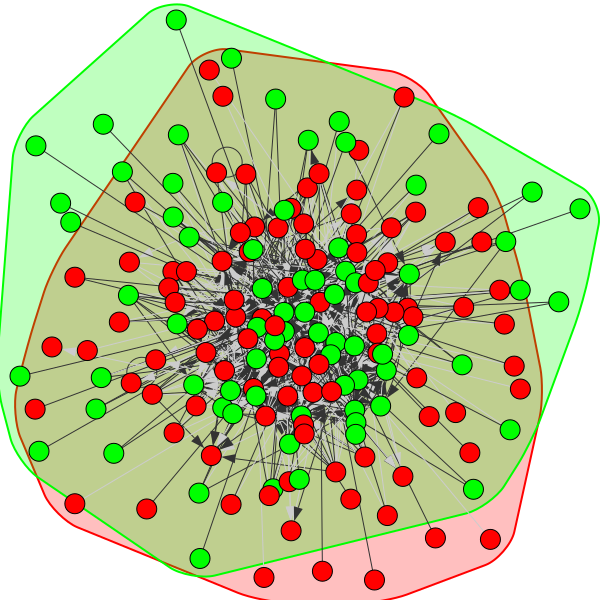

In [83]:
comm_leading_eigenvector_aj= g_aj.community_leading_eigenvector(weights = 'weight')

ig.plot(comm_leading_eigenvector_aj, mark_groups = True, layout="drl")

In [84]:
modularity = g_aj.modularity(comm_leading_eigenvector_aj, weights='weight')
print(modularity)

0.1392852852192658


In [85]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_leading_eigenvector_aj))
print('average degree: ', get_avg_degree(comm_leading_eigenvector_aj))
print('transitivity: ', get_transitivity(comm_leading_eigenvector_aj))
print('diameter: ', get_diameter(comm_leading_eigenvector_aj))

average weighted degree:  [1810.1782178217823, 5338.041095890411]
average degree:  [5.326732673267327, 9.643835616438356]
transitivity:  [0.1493288590604027, 0.3371588523442967]
diameter:  [3, 4]


In [86]:
df_leading_eigenvector_aj= pd.DataFrame({'name': list(g_aj.vs['name']), 'community':comm_leading_eigenvector_aj.membership } )
df_leading_eigenvector_aj

,name,community
0,Albania,0
1,Bahamas,0
2,Andorra,0
3,British Virgin Islands,1
4,Cayman Islands,1
...,...,...
169,Venezuela,0
170,Vietnam,1
171,Yemen,0
172,Zambia,1


In [87]:
df_leading_eigenvector_aj.describe()

,community
count,174.000000
mean,0.419540
std,0.494908
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,1.000000


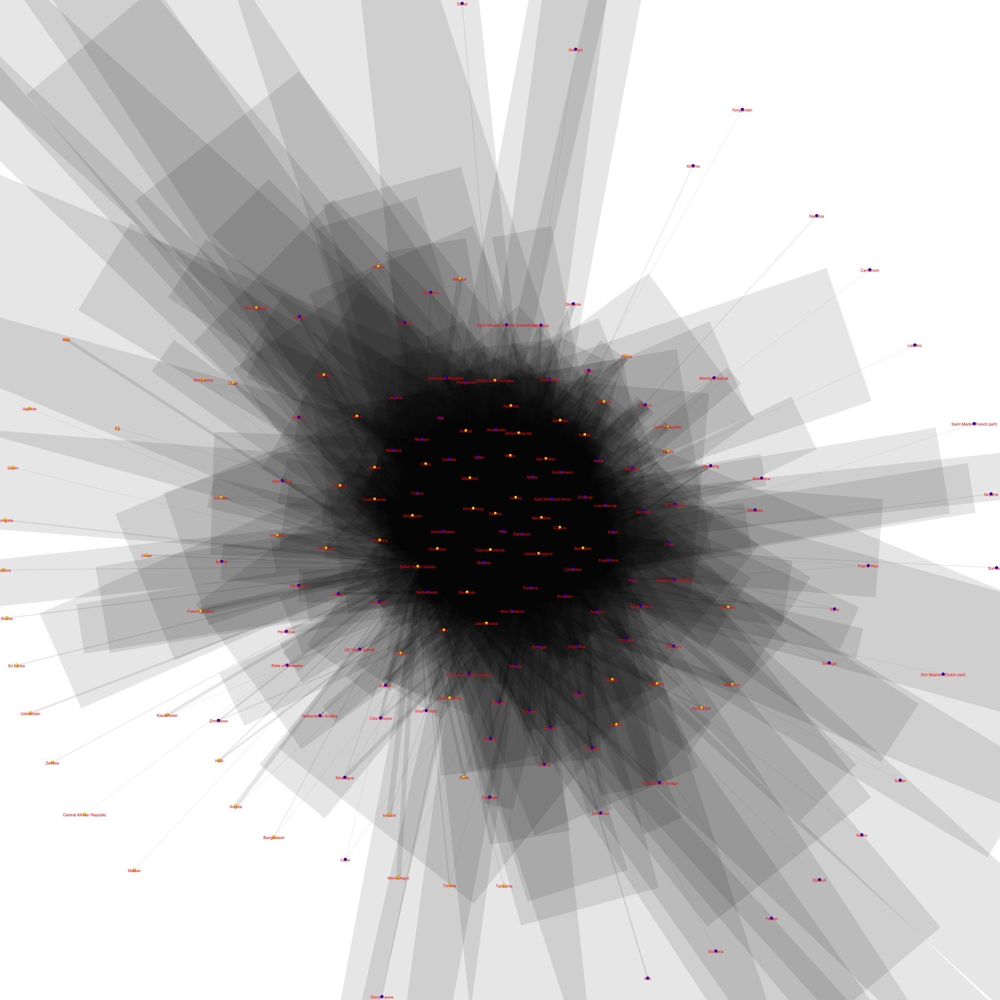

In [88]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_leading_eigenvector_aj.membership)):
    vertex_colors.append(colors[comm_leading_eigenvector_aj.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = g_aj.es['weight']

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g_aj.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g_aj,'log_images/directed_all_jur_images/communities_leading_eigenvector.png', vertex_label = g_aj.vs['name'] , **visual_style)

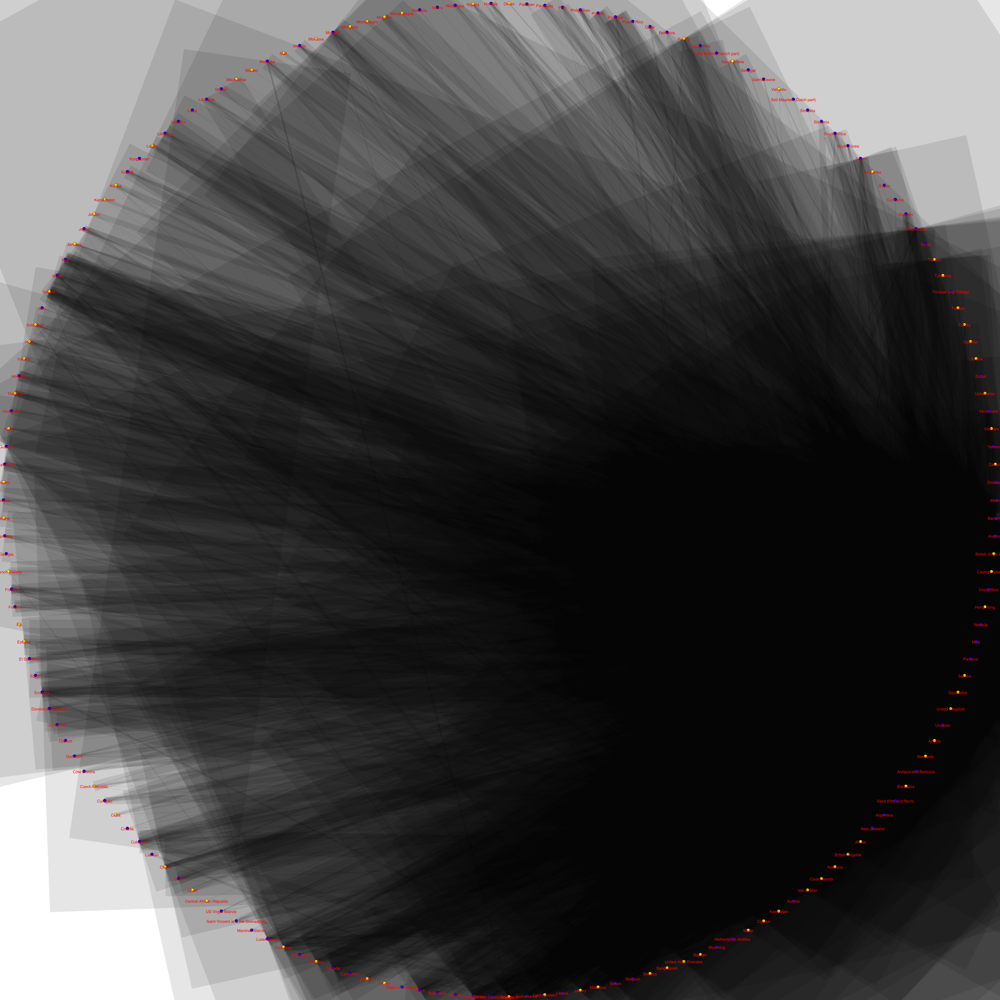

In [89]:
# Set the layout
my_layout = g_aj.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g_aj,'log_images/directed_all_jur_images/leading_vector_circular.png', vertex_label = g_aj.vs['name'] , **visual_style)

In [90]:
for i in range(len(comm_leading_eigenvector_aj.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = comm_leading_eigenvector_aj.subgraphs()[i].es['weight']
    # Set the layout
    my_layout = comm_leading_eigenvector_aj.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_leading_eigenvector_aj.subgraphs()[i],'log_images/directed_all_jur_images/leading_eigenvector_subgraph' + str(i) + '.png' ,vertex_label = comm_leading_eigenvector_aj.subgraphs()[i].vs['name'],**visual_style  )
    

SyntaxError: invalid syntax (1580682813.py, line 12)

### Spinglass Community Detection

In [ ]:
comm_spinglass_aj = g_aj.community_spinglass(weights = 'weight')

ig.plot(comm_spinglass_aj, mark_groups = True, layout="drl")

In [ ]:
modularity = g_aj.modularity(comm_spinglass_aj, weights='weight')
print(modularity)

In [ ]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_spinglass_aj))
print('average degree: ', get_avg_degree(comm_spinglass_aj))
print('transitivity: ', get_transitivity(comm_spinglass_aj))
print('diameter: ', get_diameter(comm_spinglass_aj))

In [ ]:
df_spinglass_aj = pd.DataFrame({'name': list(g_aj.vs['name']), 'community':comm_spinglass_aj.membership } )
df_spinglass_aj

In [ ]:
df_spinglass_aj.describe()

In [ ]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_spinglass_aj.membership)):
    vertex_colors.append(colors[comm_spinglass_aj.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = g_aj.es['weight']

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g_aj.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g_aj,'log_images/directed_all_jur_images/communities_spinglass.png', vertex_label = g_aj.vs['name'] , **visual_style)

In [ ]:
# Set the layout
my_layout = g_aj.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g_aj,'log_images/directed_all_jur_images/spinglass_circular.png', vertex_label = g_aj.vs['name'] , **visual_style)

In [ ]:
for i in range(len(comm_spinglass_aj.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = comm_spinglass_aj.subgraphs()[i].es['weight']
    # Set the layout
    my_layout = comm_spinglass_aj.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_spinglass_aj.subgraphs()[i],'log_images/directed_all_jur_images/spinglass_subgraph' + str(i) + '.png' ,vertex_label = comm_spinglass_aj.subgraphs()[i].vs['name'],**visual_style  )
    

### Walktrap Community Detection

In [ ]:
walktrap_aj = g_aj.community_walktrap(weights = 'weight', steps = 2)

comm_walktrap_aj = walktrap_aj.as_clustering()

ig.plot(comm_walktrap_aj, mark_groups = True, layout="drl")

In [ ]:
modularity = g_aj.modularity(comm_walktrap_aj, weights='weight')
print(modularity)

In [ ]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_walktrap_aj))
print('average degree: ', get_avg_degree(comm_walktrap_aj))
print('transitivity: ', get_transitivity(comm_walktrap_aj))
print('diameter: ', get_diameter(comm_walktrap_aj))

In [ ]:
df_walktrap_aj = pd.DataFrame({'name': list(g_aj.vs['name']), 'community':comm_walktrap_aj.membership } )
df_walktrap_aj

In [ ]:
df_walktrap_aj.describe()

In [ ]:
# ##plot community
# visual_style = {}

# vertex_colors = []

# for i in range(len(comm_walktrap_aj.membership)):
#     vertex_colors.append(colors[comm_walktrap_aj.membership[i]])
    
# # Set bbox and margin
# visual_style["bbox"] = (5000,5000)
# visual_style["margin"] = 17

# # Set vertex colours
# visual_style["vertex_color"] = vertex_colors

# # Set edge width
# visual_style["edge_width"] = g_aj.es['weight']

# # Set edge color
# visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# # Set vertex size
# visual_style["vertex_size"] = 15

# # Set vertex label size
# visual_style["vertex_label_size"] = 20

# # Set vertex label color
# visual_style["vertex_label_color"] = 'red'

# # Don't curve the edges
# visual_style["edge_curved"] = False

# # Set the layout
# my_layout = g_aj.layout_fruchterman_reingold()
# visual_style["layout"] = my_layout

# # Plot the graph
# ig.plot(g_aj,'log_images/directed_all_jur_images/communities_walktrap.png', vertex_label = g_aj.vs['name'] , **visual_style)

In [ ]:
# # Set the layout
# my_layout = g.layout_circle()
# visual_style["layout"] = my_layout

# # Plot the graph
# ig.plot(g_aj,'log_images/directed_all_jur_images/walktrap_circular.png', vertex_label = g_aj.vs['name'] , **visual_style)

In [ ]:
# for i in range(len(comm_walktrap_aj.subgraphs())):
    
#     visual_style["bbox"] = (2000,2000)
#     visual_style["margin"] = 17
    
#     # Set vertex colours
#     visual_style["vertex_color"] = 'green'

#     # Set edge width
#     visual_style["edge_width"] = comm_walktrap_aj.subgraphs()[i].es['weight']
#     # Set the layout
#     my_layout = comm_walktrap_aj.subgraphs()[i].layout_fruchterman_reingold()
#     visual_style["layout"] = my_layout

#     ig.plot(comm_walktrap_aj.subgraphs()[i],'log_images/directed_all_jur_images/walktrap_subgraph' + str(i) + '.png' ,vertex_label = comm_walktrap_aj.subgraphs()[i].vs['name'],**visual_style  )
    

### Infomap Community Detection

In [ ]:
comm_infomap_aj = g_aj.community_infomap(edge_weights = 'weight')

ig.plot(comm_infomap_aj, mark_groups = True, layout="drl")

In [ ]:
modularity = g_aj.modularity(comm_infomap_aj, weights='weight')
print(modularity)

In [ ]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_infomap_aj))
print('average degree: ', get_avg_degree(comm_infomap_aj))
print('transitivity: ', get_transitivity(comm_infomap_aj))
print('diameter: ', get_diameter(comm_infomap_aj))

In [ ]:
df_infomap_aj = pd.DataFrame({'name': list(g_aj.vs['name']), 'community':comm_infomap_aj.membership } )
df_infomap_aj

# Only Jurisdiction

In [ ]:
df_weighted['status'].unique()

In [ ]:
jurisdiction_list = ['jurisdiction']

In [ ]:
df_weighted_jur = df_weighted[df_weighted['status'].isin(jurisdiction_list)]
df_jur = df_weighted_jur.drop(['status'], axis = 1)
df_jur

In [ ]:
df_jur_grouped = df_jur.groupby(['node_start','node_end'], as_index = False).sum()
df_jur_grouped

In [ ]:
df_jur_grouped['log_weights'] = np.log(df_jur_grouped['weight']) + 1
df_jur_grouped

### Convert Data to an Undirected Edge List

In [ ]:
# df_jur_grouped_list = df_jur_grouped.values.tolist()
# df_jur_grouped_list

In [ ]:
# d = collections.defaultdict(int)
# for n1, n2, v in df_jur_grouped_list:
#     d[min(n1, n2), max(n1, n2)] += v
# result = [[k[0], k[1], v] for k, v in d.items()]

In [ ]:
# df_net = pd.DataFrame(result)
# df_net

In [ ]:
# df_net = df_net.rename(columns = {0:'node_1', 1:'node_2', 2: 'weight'})
# df_net

In [ ]:
#df_net.to_csv('undirected_weighted_grouped.csv', index = False)

In [ ]:
# df_net.describe()

## Create Graph

In [ ]:
g_j = ig.Graph.TupleList(df_jur_grouped.itertuples(index=False), directed=True, edge_attrs={'weight': "log_weights"})


In [ ]:
ig.plot(g_j)

In [ ]:
g_j.diameter()

In [ ]:
print( "Clustering Coefficient: ", g_j.transitivity_undirected())

In [ ]:
np.mean(g_j.degree())

In [ ]:
np.mean(g_j.strength(weights = 'weight'))

In [ ]:
df_strength = pd.DataFrame({'name': list(g_j.vs['name']), 'weighted_degree':g_j.strength(weights = 'weight') } )
df_strength = df_strength.sort_values('weighted_degree', ascending = False).reset_index(drop = True)
df_strength

## Community Detection

### Label Propogation Community Detection

In [ ]:
comm_lp_j= g_j.community_label_propagation(weights = 'weight')

ig.plot(comm_lp_j, mark_groups = True, layout="drl")

In [ ]:
modularity = g_j.modularity(comm_lp_j, weights='weight')
print(modularity)

In [ ]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_lp_j))
print('average degree: ', get_avg_degree(comm_lp_j))
print('transitivity: ', get_transitivity(comm_lp_j))
print('diameter: ', get_diameter(comm_lp_j))

### Leading Eigenvector Community Detection

In [ ]:
comm_leading_eigenvector_j= g_j.community_leading_eigenvector(weights = 'weight')

ig.plot(comm_leading_eigenvector_j, mark_groups = True, layout="drl")

In [ ]:
modularity = g_j.modularity(comm_leading_eigenvector_j, weights='weight')
print(modularity)

In [ ]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_leading_eigenvector_j))
print('average degree: ', get_avg_degree(comm_leading_eigenvector_j))
print('transitivity: ', get_transitivity(comm_leading_eigenvector_j))
print('diameter: ', get_diameter(comm_leading_eigenvector_j))

In [ ]:
df_leading_eigenvector_j= pd.DataFrame({'name': list(g_j.vs['name']), 'community':comm_leading_eigenvector_j.membership } )
df_leading_eigenvector_j

In [ ]:
df_leading_eigenvector_j.describe()

In [ ]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_leading_eigenvector_j.membership)):
    vertex_colors.append(colors[comm_leading_eigenvector_j.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = g_j.es['weight']

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g_j.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g_j,'log_imagesdirected_all_jur_images/communities_leading_eigenvector.png', vertex_label = g_j.vs['name'] , **visual_style)

In [ ]:
# Set the layout
my_layout = g_j.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g_j,'log_images/directed_all_jur_images/leading_vector_circular.png', vertex_label = g_j.vs['name'] , **visual_style)

In [ ]:
for i in range(len(comm_leading_eigenvector_j.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = comm_leading_eigenvector_j.subgraphs()[i].es['weight']
    # Set the layout
    my_layout = comm_leading_eigenvector_j.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_leading_eigenvector_j.subgraphs()[i],'log_images/directed_all_jur_images/leading_eigenvector_subgraph' + str(i) + '.png' ,vertex_label = comm_leading_eigenvector_j.subgraphs()[i].vs['name'],**visual_style  )
    

### Spinglass Community Detection

In [ ]:
comm_spinglass_j = g_j.community_spinglass(weights = 'weight')

ig.plot(comm_spinglass_j, mark_groups = True, layout="drl")

In [ ]:
modularity = g_j.modularity(comm_spinglass_j, weights='weight')
print(modularity)

In [ ]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_spinglass_j))
print('average degree: ', get_avg_degree(comm_spinglass_j))
print('transitivity: ', get_transitivity(comm_spinglass_j))
print('diameter: ', get_diameter(comm_spinglass_j))

In [ ]:
df_spinglass_j = pd.DataFrame({'name': list(g_j.vs['name']), 'community':comm_spinglass_j.membership } )
df_spinglass_j

In [ ]:
df_spinglass_j.describe()

In [ ]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_spinglass_j.membership)):
    vertex_colors.append(colors[comm_spinglass_j.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = np.log(g_j.es['weight']) + 1

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g_j.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g_j,'log_images/directed_all_jur_images/communities_spinglass.png', vertex_label = g_j.vs['name'] , **visual_style)

In [ ]:
# Set the layout
my_layout = g_j.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g_j,'log_images/directed_all_jur_images/spinglass_circular.png', vertex_label = g_j.vs['name'] , **visual_style)

In [ ]:
for i in range(len(comm_spinglass_j.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = comm_spinglass_j.subgraphs()[i].es['weight']
    # Set the layout
    my_layout = comm_spinglass_j.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_spinglass_j.subgraphs()[i],'log_images/directed_all_jur_images/spinglass_subgraph' + str(i) + '.png' ,vertex_label = comm_spinglass_j.subgraphs()[i].vs['name'],**visual_style  )
    

### Walktrap Community Detection

In [ ]:
walktrap_j = g_j.community_walktrap(weights = 'weight', steps = 2)

comm_walktrap_j = walktrap_j.as_clustering()

ig.plot(comm_walktrap_j, mark_groups = True, layout="drl")

In [ ]:
modularity = g_j.modularity(comm_walktrap_j, weights='weight')
print(modularity)

In [ ]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_walktrap_j))
print('average degree: ', get_avg_degree(comm_walktrap_j))
print('transitivity: ', get_transitivity(comm_walktrap_j))
print('diameter: ', get_diameter(comm_walktrap_j))

In [ ]:
df_walktrap_j = pd.DataFrame({'name': list(g_j.vs['name']), 'community':comm_walktrap_j.membership } )
df_walktrap_j

In [ ]:
df_walktrap_j.describe()

In [ ]:
# ##plot community
# visual_style = {}

# vertex_colors = []

# for i in range(len(comm_walktrap_j.membership)):
#     vertex_colors.append(colors[comm_walktrap_j.membership[i]])
    
# # Set bbox and margin
# visual_style["bbox"] = (5000,5000)
# visual_style["margin"] = 17

# # Set vertex colours
# visual_style["vertex_color"] = vertex_colors

# # Set edge width
# visual_style["edge_width"] = g_j.es['weight']

# # Set edge color
# visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# # Set vertex size
# visual_style["vertex_size"] = 15

# # Set vertex label size
# visual_style["vertex_label_size"] = 20

# # Set vertex label color
# visual_style["vertex_label_color"] = 'red'

# # Don't curve the edges
# visual_style["edge_curved"] = False

# # Set the layout
# my_layout = g_j.layout_fruchterman_reingold()
# visual_style["layout"] = my_layout

# # Plot the graph
# ig.plot(g_j,'log_images/directed_all_jur_images/communities_walktrap.png', vertex_label = g_j.vs['name'] , **visual_style)

In [ ]:
# # Set the layout
# my_layout = g_j.layout_circle()
# visual_style["layout"] = my_layout

# # Plot the graph
# ig.plot(g_j,'log_images/directed_all_jur_images/walktrap_circular.png', vertex_label = g_j.vs['name'] , **visual_style)

In [ ]:
# for i in range(len(comm_walktrap_j.subgraphs())):
    
#     visual_style["bbox"] = (2000,2000)
#     visual_style["margin"] = 17
    
#     # Set vertex colours
#     visual_style["vertex_color"] = 'green'

#     # Set edge width
#     visual_style["edge_width"] = comm_walktrap_j.subgraphs()[i].es['weight']
#     # Set the layout
#     my_layout = comm_walktrap_j.subgraphs()[i].layout_fruchterman_reingold()
#     visual_style["layout"] = my_layout

#     ig.plot(comm_walktrap_j.subgraphs()[i],'log_images/directed_all_jur_images/walktrap_subgraph' + str(i) + '.png' ,vertex_label = comm_walktrap_j.subgraphs()[i].vs['name'],**visual_style  )
    

### Infomap Community Detection

In [ ]:
comm_infomap_j = g_j.community_infomap(edge_weights = 'weight')

ig.plot(comm_infomap_j, mark_groups = True, layout="drl")

In [ ]:
modularity = g_j.modularity(comm_infomap_j, weights='weight')
print(modularity)

In [ ]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_infomap_j))
print('average degree: ', get_avg_degree(comm_infomap_j))
print('transitivity: ', get_transitivity(comm_infomap_j))
print('diameter: ', get_diameter(comm_infomap_j))

In [ ]:
df_infomap_j = pd.DataFrame({'name': list(g_j.vs['name']), 'community':comm_infomap_j.membership } )
df_infomap_j

# Officer Jurisdiction

In [ ]:
df_weighted['status'].unique()

In [ ]:
jurisdiction_list = ['officer_jurisdiction']

In [ ]:
df_weighted_jur = df_weighted[df_weighted['status'].isin(jurisdiction_list)]
df_jur = df_weighted_jur.drop(['status'], axis = 1)
df_jur

In [ ]:
df_jur_grouped = df_jur.groupby(['node_start','node_end'], as_index = False).sum()
df_jur_grouped

In [ ]:
df_jur_grouped['log_weights'] = np.log(df_jur_grouped['weight']) + 1
df_jur_grouped

### Convert Data to an Undirected Edge List

In [ ]:
# df_jur_grouped_list = df_jur_grouped.values.tolist()
# df_jur_grouped_list

In [ ]:
# d = collections.defaultdict(int)
# for n1, n2, v in df_jur_grouped_list:
#     d[min(n1, n2), max(n1, n2)] += v
# result = [[k[0], k[1], v] for k, v in d.items()]

In [ ]:
# df_net = pd.DataFrame(result)
# df_net

In [ ]:
# df_net = df_net.rename(columns = {0:'node_1', 1:'node_2', 2: 'weight'})
# df_net

In [ ]:
#df_net.to_csv('undirected_weighted_grouped.csv', index = False)

In [ ]:
# df_net.describe()

## Create Graph

In [ ]:
g_oj = ig.Graph.TupleList(df_jur_grouped.itertuples(index=False), directed=True, edge_attrs={'weight': "log_weights"})


In [ ]:
ig.plot(g_oj)

In [ ]:
g_oj.diameter()

In [ ]:
print( "Clustering Coefficient: ", g_oj.transitivity_undirected())

In [ ]:
np.mean(g_oj.degree())

In [ ]:
np.mean(g_oj.strength(weights = 'weight'))

In [ ]:
df_strength = pd.DataFrame({'name': list(g_oj.vs['name']), 'weighted_degree':g_oj.strength(weights = 'weight') } )
df_strength = df_strength.sort_values('weighted_degree', ascending = False).reset_index(drop = True)
df_strength

## Community Detection

### Label Propogation Community Detection

In [ ]:
comm_lp_oj= g_oj.community_label_propagation(weights = 'weight')

ig.plot(comm_lp_oj, mark_groups = True, layout="drl")

In [ ]:
modularity = g_oj.modularity(comm_lp_oj, weights='weight')
print(modularity)

In [ ]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_lp_oj))
print('average degree: ', get_avg_degree(comm_lp_oj))
print('transitivity: ', get_transitivity(comm_lp_oj))
print('diameter: ', get_diameter(comm_lp_oj))

### Leading Eigenvector Community Detection

In [ ]:
comm_leading_eigenvector_oj= g_oj.community_leading_eigenvector(weights = 'weight')

ig.plot(comm_leading_eigenvector_oj, mark_groups = True, layout="drl")

In [ ]:
modularity = g_oj.modularity(comm_leading_eigenvector_oj, weights='weight')
print(modularity)

In [ ]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_leading_eigenvector_oj))
print('average degree: ', get_avg_degree(comm_leading_eigenvector_oj))
print('transitivity: ', get_transitivity(comm_leading_eigenvector_oj))
print('diameter: ', get_diameter(comm_leading_eigenvector_oj))

In [ ]:
df_leading_eigenvector_oj= pd.DataFrame({'name': list(g_oj.vs['name']), 'community':comm_leading_eigenvector_oj.membership } )
df_leading_eigenvector_oj

In [ ]:
df_leading_eigenvector_oj.describe()

In [ ]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_leading_eigenvector_oj.membership)):
    vertex_colors.append(colors[comm_leading_eigenvector_oj.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = g_oj.es['weight']

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g_oj.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g_oj,'log_images/directed_all_jur_images/communities_leading_eigenvector.png', vertex_label = g_oj.vs['name'] , **visual_style)

In [ ]:
# Set the layout
my_layout = g_oj.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g_oj,'log_images/directed_all_jur_images/leading_vector_circular.png', vertex_label = g_oj.vs['name'] , **visual_style)

In [ ]:
for i in range(len(comm_leading_eigenvector_oj.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = comm_leading_eigenvector_oj.subgraphs()[i].es['weight']
    # Set the layout
    my_layout = comm_leading_eigenvector_oj.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_leading_eigenvector_oj.subgraphs()[i],'log_images/directed_all_jur_images/leading_eigenvector_subgraph' + str(i) + '.png' ,vertex_label = comm_leading_eigenvector_oj.subgraphs()[i].vs['name'],**visual_style  )
    

### Spinglass Community Detection

In [ ]:
comm_spinglass_oj = g_oj.community_spinglass(weights = 'weight')

ig.plot(comm_spinglass_oj, mark_groups = True, layout="drl")

In [ ]:
modularity = g_oj.modularity(comm_spinglass_oj, weights='weight')
print(modularity)

In [ ]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_spinglass_oj))
print('average degree: ', get_avg_degree(comm_spinglass_oj))
print('transitivity: ', get_transitivity(comm_spinglass_oj))
print('diameter: ', get_diameter(comm_spinglass_oj))

In [ ]:
df_spinglass_oj = pd.DataFrame({'name': list(g_oj.vs['name']), 'community':comm_spinglass_oj.membership } )
df_spinglass_oj

In [ ]:
df_spinglass_oj.describe()

In [ ]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_spinglass_oj.membership)):
    vertex_colors.append(colors[comm_spinglass_oj.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = g_oj.es['weight']

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g_oj.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g_oj,'log_images/directed_all_jur_images/communities_spinglass.png', vertex_label = g_oj.vs['name'] , **visual_style)

In [ ]:
# Set the layout
my_layout = g_oj.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g_oj,'log_images/directed_all_jur_images/spinglass_circular.png', vertex_label = g_oj.vs['name'] , **visual_style)

In [ ]:
for i in range(len(comm_spinglass_oj.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = comm_spinglass_oj.subgraphs()[i].es['weight']
    # Set the layout
    my_layout = comm_spinglass_oj.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_spinglass_oj.subgraphs()[i],'log_images/directed_all_jur_images/spinglass_subgraph' + str(i) + '.png' ,vertex_label = comm_spinglass_oj.subgraphs()[i].vs['name'],**visual_style  )
    

### Walktrap Community Detection

In [ ]:
walktrap_oj = g_oj.community_walktrap(weights = 'weight', steps = 2)

comm_walktrap_oj = walktrap_oj.as_clustering()

ig.plot(comm_walktrap_oj, mark_groups = True, layout="drl")

In [ ]:
modularity = g_oj.modularity(comm_walktrap_oj, weights='weight')
print(modularity)

In [ ]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_walktrap_oj))
print('average degree: ', get_avg_degree(comm_walktrap_oj))
print('transitivity: ', get_transitivity(comm_walktrap_oj))
print('diameter: ', get_diameter(comm_walktrap_oj))

In [ ]:
df_walktrap_oj = pd.DataFrame({'name': list(g_oj.vs['name']), 'community':comm_walktrap_oj.membership } )
df_walktrap_oj

In [ ]:
df_walktrap_oj.describe()

In [ ]:
# ##plot community
# visual_style = {}

# vertex_colors = []

# for i in range(len(comm_walktrap_oj.membership)):
#     vertex_colors.append(colors[comm_walktrap_oj.membership[i]])
    
# # Set bbox and margin
# visual_style["bbox"] = (5000,5000)
# visual_style["margin"] = 17

# # Set vertex colours
# visual_style["vertex_color"] = vertex_colors

# # Set edge width
# visual_style["edge_width"] = g_oj.es['weight']

# # Set edge color
# visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# # Set vertex size
# visual_style["vertex_size"] = 15

# # Set vertex label size
# visual_style["vertex_label_size"] = 20

# # Set vertex label color
# visual_style["vertex_label_color"] = 'red'

# # Don't curve the edges
# visual_style["edge_curved"] = False

# # Set the layout
# my_layout = g_oj.layout_fruchterman_reingold()
# visual_style["layout"] = my_layout

# # Plot the graph
# ig.plot(g_oj,'log_images/directed_all_jur_images/communities_walktrap.png', vertex_label = g_oj.vs['name'] , **visual_style)

In [ ]:
# # Set the layout
# my_layout = g_oj.layout_circle()
# visual_style["layout"] = my_layout

# # Plot the graph
# ig.plot(g_oj,'log_images/directed_all_jur_images/walktrap_circular.png', vertex_label = g_oj.vs['name'] , **visual_style)

In [ ]:
# for i in range(len(comm_walktrap_oj.subgraphs())):
    
#     visual_style["bbox"] = (2000,2000)
#     visual_style["margin"] = 17
    
#     # Set vertex colours
#     visual_style["vertex_color"] = 'green'

#     # Set edge width
#     visual_style["edge_width"] = comm_walktrap_oj.subgraphs()[i].es['weight']
#     # Set the layout
#     my_layout = comm_walktrap_oj.subgraphs()[i].layout_fruchterman_reingold()
#     visual_style["layout"] = my_layout

#     ig.plot(comm_walktrap_oj.subgraphs()[i],'log_images/directed_all_jur_images/walktrap_subgraph' + str(i) + '.png' ,vertex_label = comm_walktrap_oj.subgraphs()[i].vs['name'],**visual_style  )
    

### Infomap Community Detection

In [ ]:
comm_infomap_oj = g_oj.community_infomap(edge_weights = 'weight')

ig.plot(comm_infomap_oj, mark_groups = True, layout="drl")

In [ ]:
modularity = g_oj.modularity(comm_infomap_oj, weights='weight')
print(modularity)

In [ ]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_infomap_oj))
print('average degree: ', get_avg_degree(comm_infomap_oj))
print('transitivity: ', get_transitivity(comm_infomap_oj))
print('diameter: ', get_diameter(comm_infomap_oj))

In [ ]:
df_infomap_oj = pd.DataFrame({'name': list(g_oj.vs['name']), 'community':comm_infomap_oj.membership } )
df_infomap_oj

# No Intermediary

In [ ]:
df_weighted['status'].unique()

In [ ]:
jurisdiction_list = ['officer_jurisdiction', 'jurisdiction', 'officer_base']

In [ ]:
df_weighted_jur = df_weighted[df_weighted['status'].isin(jurisdiction_list)]
df_jur = df_weighted_jur.drop(['status'], axis = 1)
df_jur

In [ ]:
df_jur_grouped = df_jur.groupby(['node_start','node_end'], as_index = False).sum()
df_jur_grouped

In [ ]:
df_jur_grouped['log_weights'] = np.log(df_jur_grouped['weight']) + 1
df_jur_grouped

### Convert Data to an Undirected Edge List

In [ ]:
# df_jur_grouped_list = df_jur_grouped.values.tolist()
# df_jur_grouped_list

In [ ]:
# d = collections.defaultdict(int)
# for n1, n2, v in df_jur_grouped_list:
#     d[min(n1, n2), max(n1, n2)] += v
# result = [[k[0], k[1], v] for k, v in d.items()]

In [ ]:
# df_net = pd.DataFrame(result)
# df_net

In [ ]:
# df_net = df_net.rename(columns = {0:'node_1', 1:'node_2', 2: 'weight'})
# df_net

In [ ]:
#df_net.to_csv('undirected_weighted_grouped.csv', index = False)

In [ ]:
# df_net.describe()

## Create Graph

In [ ]:
g_ni = ig.Graph.TupleList(df_jur_grouped.itertuples(index=False), directed=True, edge_attrs={'weight': "log_weights"})


In [ ]:
ig.plot(g_ni)

In [ ]:
g_ni.diameter()

In [ ]:
print( "Clustering Coefficient: ", g_ni.transitivity_undirected())

In [ ]:
np.mean(g_ni.degree())

In [ ]:
np.mean(g_ni.strength(weights = 'weight'))

In [ ]:
df_strength = pd.DataFrame({'name': list(g_ni.vs['name']), 'weighted_degree':g_ni.strength(weights = 'weight') } )
df_strength = df_strength.sort_values('weighted_degree', ascending = False).reset_index(drop = True)
df_strength

## Community Detection

### Label Propogation Community Detection

In [ ]:
comm_lp_ni= g_ni.community_label_propagation(weights = 'weight')

ig.plot(comm_lp_ni, mark_groups = True, layout="drl")

In [ ]:
modularity = g_ni.modularity(comm_lp_ni, weights='weight')
print(modularity)

In [ ]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_lp_ni))
print('average degree: ', get_avg_degree(comm_lp_ni))
print('transitivity: ', get_transitivity(comm_lp_ni))
print('diameter: ', get_diameter(comm_lp_ni))

### Leading Eigenvector Community Detection

In [ ]:
comm_leading_eigenvector_ni= g_ni.community_leading_eigenvector(weights = 'weight')

ig.plot(comm_leading_eigenvector_ni, mark_groups = True, layout="drl")

In [ ]:
modularity = g_ni.modularity(comm_leading_eigenvector_ni, weights='weight')
print(modularity)

In [ ]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_leading_eigenvector_ni))
print('average degree: ', get_avg_degree(comm_leading_eigenvector_ni))
print('transitivity: ', get_transitivity(comm_leading_eigenvector_ni))
print('diameter: ', get_diameter(comm_leading_eigenvector_ni))

In [ ]:
df_leading_eigenvector_ni= pd.DataFrame({'name': list(g_ni.vs['name']), 'community':comm_leading_eigenvector_ni.membership } )
df_leading_eigenvector_ni

In [ ]:
df_leading_eigenvector_ni.describe()

In [ ]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_leading_eigenvector_ni.membership)):
    vertex_colors.append(colors[comm_leading_eigenvector_ni.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = g_ni.es['weight']

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g_ni.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g_ni,'log_imagesdirected_all_jur_images/communities_leading_eigenvector.png', vertex_label = g_ni.vs['name'] , **visual_style)

In [ ]:
# Set the layout
my_layout = g_ni.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g_ni,'log_imagesdirected_all_jur_images/leading_vector_circular.png', vertex_label = g_ni.vs['name'] , **visual_style)

In [ ]:
for i in range(len(comm_leading_eigenvector_ni.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = comm_leading_eigenvector_ni.subgraphs()[i].es['weight']
    # Set the layout
    my_layout = comm_leading_eigenvector_ni.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_leading_eigenvector_ni.subgraphs()[i],'log_imagesdirected_all_jur_images/leading_eigenvector_subgraph' + str(i) + '.png' ,vertex_label = comm_leading_eigenvector_ni.subgraphs()[i].vs['name'],**visual_style  )
    

### Spinglass Community Detection

In [ ]:
comm_spinglass_ni = g_ni.community_spinglass(weights = 'weight')

ig.plot(comm_spinglass_ni, mark_groups = True, layout="drl")

In [ ]:
modularity = g_ni.modularity(comm_spinglass_ni, weights='weight')
print(modularity)

In [ ]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_spinglass_ni))
print('average degree: ', get_avg_degree(comm_spinglass_ni))
print('transitivity: ', get_transitivity(comm_spinglass_ni))
print('diameter: ', get_diameter(comm_spinglass_ni))

In [ ]:
df_spinglass_ni = pd.DataFrame({'name': list(g_ni.vs['name']), 'community':comm_spinglass_ni.membership } )
df_spinglass_ni

In [ ]:
df_spinglass_ni.describe()

In [ ]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_spinglass_ni.membership)):
    vertex_colors.append(colors[comm_spinglass_ni.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = g_ni.es['weight']

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g_ni.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g_ni,'log_images/directed_all_jur_images/communities_spinglass.png', vertex_label = g_ni.vs['name'] , **visual_style)

In [ ]:
# Set the layout
my_layout = g_ni.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g_ni,'log_images/directed_all_jur_images/spinglass_circular.png', vertex_label = g_ni.vs['name'] , **visual_style)

In [ ]:
for i in range(len(comm_spinglass_ni.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = comm_spinglass_ni.subgraphs()[i].es['weight']
    # Set the layout
    my_layout = comm_spinglass_ni.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_spinglass_ni.subgraphs()[i],'log_images/directed_all_jur_images/spinglass_subgraph' + str(i) + '.png' ,vertex_label = comm_spinglass_ni.subgraphs()[i].vs['name'],**visual_style  )
    

### Walktrap Community Detection

In [ ]:
walktrap_ni = g_ni.community_walktrap(weights = 'weight', steps = 2)

comm_walktrap_ni = walktrap_ni.as_clustering()

ig.plot(comm_walktrap_ni, mark_groups = True, layout="drl")

In [ ]:
modularity = g_ni.modularity(comm_walktrap_ni, weights='weight')
print(modularity)

In [ ]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_walktrap_ni))
print('average degree: ', get_avg_degree(comm_walktrap_ni))
print('transitivity: ', get_transitivity(comm_walktrap_ni))
print('diameter: ', get_diameter(comm_walktrap_ni))

In [ ]:
df_walktrap_ni = pd.DataFrame({'name': list(g_ni.vs['name']), 'community':comm_walktrap_ni.membership } )
df_walktrap_ni

In [ ]:
df_walktrap_ni.describe()

In [ ]:
# ##plot community
# visual_style = {}

# vertex_colors = []

# for i in range(len(comm_walktrap_ni.membership)):
#     vertex_colors.append(colors[comm_walktrap_ni.membership[i]])
    
# # Set bbox and margin
# visual_style["bbox"] = (5000,5000)
# visual_style["margin"] = 17

# # Set vertex colours
# visual_style["vertex_color"] = vertex_colors

# # Set edge width
# visual_style["edge_width"] = g_ni.es['weight']

# # Set edge color
# visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# # Set vertex size
# visual_style["vertex_size"] = 15

# # Set vertex label size
# visual_style["vertex_label_size"] = 20

# # Set vertex label color
# visual_style["vertex_label_color"] = 'red'

# # Don't curve the edges
# visual_style["edge_curved"] = False

# # Set the layout
# my_layout = g_ni.layout_fruchterman_reingold()
# visual_style["layout"] = my_layout

# # Plot the graph
# ig.plot(g_ni,'log_images/directed_all_jur_images/communities_walktrap.png', vertex_label = g_ni.vs['name'] , **visual_style)

In [ ]:
# # Set the layout
# my_layout = g_ni.layout_circle()
# visual_style["layout"] = my_layout

# # Plot the graph
# ig.plot(g_ni,'log_images/directed_all_jur_images/walktrap_circular.png', vertex_label = g_ni.vs['name'] , **visual_style)

In [ ]:
# for i in range(len(comm_walktrap_ni.subgraphs())):
    
#     visual_style["bbox"] = (2000,2000)
#     visual_style["margin"] = 17
    
#     # Set vertex colours
#     visual_style["vertex_color"] = 'green'

#     # Set edge width
#     visual_style["edge_width"] = comm_walktrap_ni.subgraphs()[i].es['weight']
#     # Set the layout
#     my_layout = comm_walktrap_ni.subgraphs()[i].layout_fruchterman_reingold()
#     visual_style["layout"] = my_layout

#     ig.plot(comm_walktrap_ni.subgraphs()[i],'log_images/directed_all_jur_images/walktrap_subgraph' + str(i) + '.png' ,vertex_label = comm_walktrap_ni.subgraphs()[i].vs['name'],**visual_style  )
    

### Infomap Community Detection

In [ ]:
comm_infomap_ni = g_ni.community_infomap(edge_weights = 'weight')

ig.plot(comm_infomap_ni, mark_groups = True, layout="drl")

In [ ]:
modularity = g_ni.modularity(comm_infomap_ni, weights='weight')
print(modularity)

In [ ]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_infomap_ni))
print('average degree: ', get_avg_degree(comm_infomap_ni))
print('transitivity: ', get_transitivity(comm_infomap_ni))
print('diameter: ', get_diameter(comm_infomap_ni))

In [ ]:
df_infomap_ni = pd.DataFrame({'name': list(g_ni.vs['name']), 'community':comm_infomap_ni.membership } )
df_infomap_ni